# Lab07 - Image Processing and Analysis
Full name: Đinh Anh Huy - ID Student: 18110103

In [1]:
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray
import warnings
warnings.filterwarnings('ignore')

In [2]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt
    import matplotlib.gridspec as gridspec
    gs = gridspec.GridSpec(nRows, nCols)
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,20))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        
        plt.subplot(nRows, nCols,i+1)
        
        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')
        
    plt.show()

In [3]:
def InfoImage(IM):
    Image = IM
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    
    if(Channel == 2):
        print("Min Intensity: ", IM.min(), " Max Intensity: ", IM.max())
    else:
        print("Red - Min Intensity: ", IM[:,:,0].min(), " Max Intensity: ", IM[:,:,0].max())
        print("Green - Min Intensity: ", IM[:,:,1].min(), " Max Intensity: ", IM[:,:,1].max())
        print("Blue - Min Intensity: ", IM[:,:,2].min(), " Max Intensity: ", IM[:,:,2].max())

In [4]:
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    from skimage.transform import rescale, resize
    
    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth
    Height = DesiredHeight
    if((Width == 0) & (Height == 0)):
        return IM
    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)
    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)
        
    dim = (Width, Height)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST)
    return resizedIM

In [5]:
def read_image(img_path):
    img_color = imread(img_path)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_RGB2GRAY)
    return (img_color, img_gray)

## Phương pháp morphological dilation

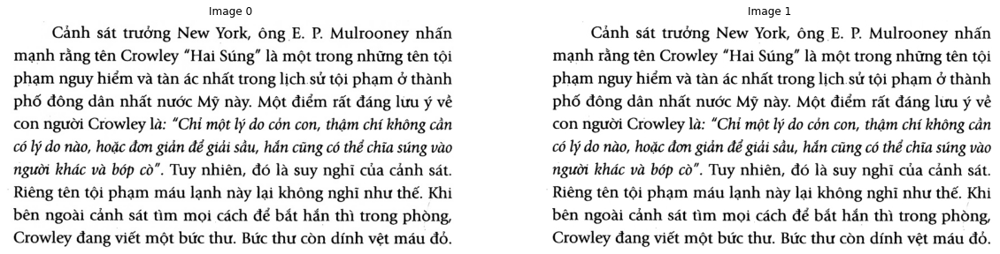

In [6]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/Newspaper.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

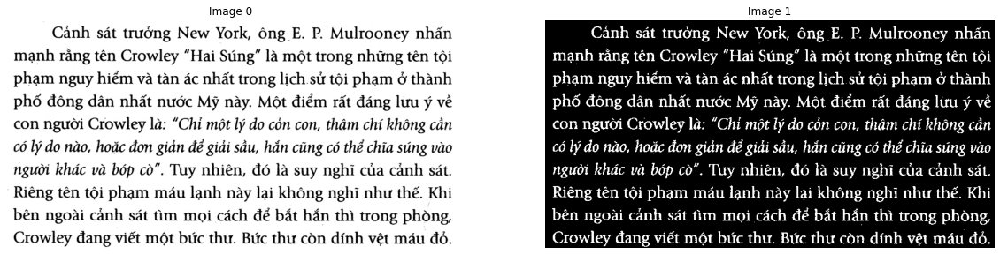

In [7]:
thresh, image_mask = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)
ShowImage([image_gray, image_mask], 1, 2)

In [8]:
def morphological_dilation(image_mask, image_color, kernel_size = None, iterations = 2, threshold = 10):
    if kernel_size == None:
        kernel = np.ones((3,3),np.uint8)
    else:
        kernel = np.ones(kernel_size,np.uint8)
    image_dilated = cv2.dilate(image_mask, kernel, iterations = iterations)
    result = image_color.copy()
    contours, hierarchy = cv2.findContours(image_dilated,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    count = 0
    DataDF = pd.DataFrame(columns = ["x", "y", "w", "h"])
    for cnt in contours:
        x,y,w,h = cv2.boundingRect(cnt)
        if(w * h > threshold):
            cv2.rectangle(result,(x,y),(x+w,y+h),(0,255,0),2)
            DataDF.loc[count,:] = (x,y,w,h)
            count = count + 1
    DataDF = DataDF.astype(int)
    return DataDF, result, image_dilated

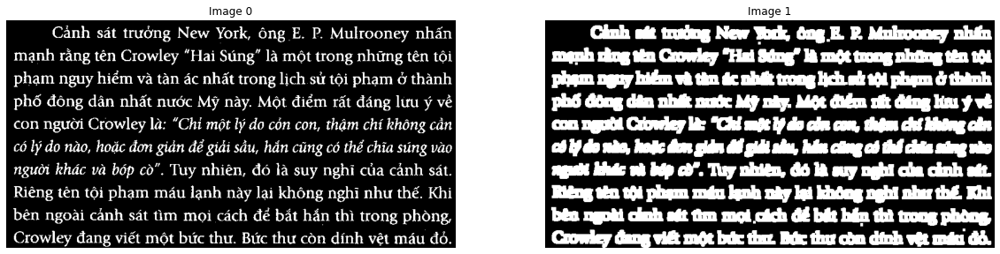

In [9]:
DataDF, result_dilated, image_dilated = morphological_dilation(image_mask, image_color, threshold = 300)
ShowImage([image_mask, image_dilated], 1, 2)

,x,y,w,h
0,700,384,59,24
1,653,384,42,27
2,531,384,49,24
3,425,383,49,25
4,250,383,56,28


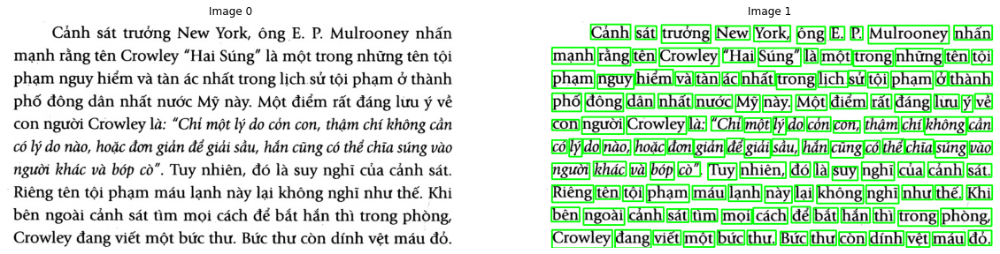

In [10]:
display(DataDF.head())
ShowImage([image_color, result_dilated], 1, 2)

## Phương pháp morphological erosion

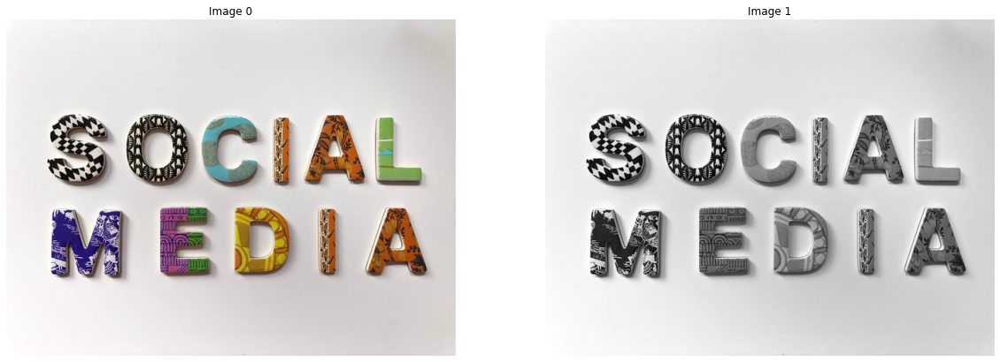

In [11]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/alphabet.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [12]:
def get_label_objs(image_mor, image_gray):
    from skimage.measure import label, regionprops
    image_mask = image_mor.copy()
    image_label = label(image_mask) # Label each area in the image from 1 to n
    
    regions = regionprops(image_label, intensity_image=image_gray, coordinates='rc')
    ColList = ["label", "at_row", "at_col",
    "area", "minr", "minc", "maxr", "maxc", "width", "height",
    "max_intensity", "mean_intensity", "min_intensity",]
    
    LabelDF = pd.DataFrame(columns = ColList)
    for props in regions:
        RowList = []
        label = props.label
        if("label" in ColList):
            RowList.append(label)
            
        at_row, at_col = props.centroid
        if("at_row" in ColList):
            RowList.append(at_row)
            
        if("at_col" in ColList):
            RowList.append(at_col)
            
        if("area" in ColList):
            RowList.append(props.area)
            
        minr, minc, maxr, maxc = props.bbox
        if("minr" in ColList):
            RowList.append(minr)
            
        if("minc" in ColList):
            RowList.append(minc)
            
        if("maxr" in ColList):
            RowList.append(maxr)
            
        if("maxc" in ColList):
            RowList.append(maxc)
            
        if("width" in ColList):
            RowList.append(maxc - minc)
            
        if("height" in ColList):
            RowList.append(maxr - minr)
            
        if("max_intensity" in ColList):
            RowList.append(props.max_intensity)
            
        if("mean_intensity" in ColList):
            RowList.append(props.mean_intensity)
            
        if("min_intensity" in ColList):
            RowList.append(props.min_intensity)
            
        LabelDF.loc[label-1, 0 : len(RowList)] = RowList
    LabelDF = LabelDF.sort_values(by = "area", ascending = False).reset_index(drop = True)
    return image_label, LabelDF

In [13]:
def mask_area_obj(result, LabelDF, idx, color = (0,255,0), width_line = 5):
    x = int(LabelDF.loc[idx, "minc"])
    y = int(LabelDF.loc[idx, "minr"])
    w = int(LabelDF.loc[idx, "width"])
    h = int(LabelDF.loc[idx, "height"])
    cv2.rectangle(result,(x,y),(x+w,y+h),color,width_line)
    return result

In [14]:
def morphological_erosion(image_gray, kernel_size = None, iterations = 1, threshold = 50):
    thresh, image_mask = cv2.threshold(image_gray,threshold,255,cv2.THRESH_BINARY_INV)
    
    if kernel_size == None:
        kernel = np.ones((3,3),np.uint8)
    else:
        kernel = np.ones(kernel_size, np.uint8)
    image_erosion = cv2.erode(image_mask,kernel,iterations = iterations)
    return image_mask, image_erosion

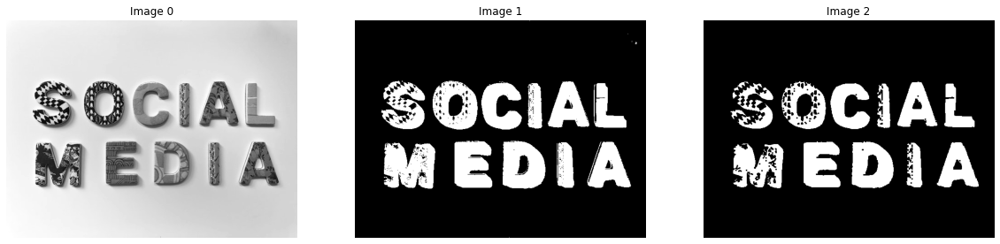

In [15]:
image_mask, image_erosion = morphological_erosion(image_gray, kernel_size = (3,3), iterations = 1, threshold = 195)
ShowImage([image_gray, image_mask, image_erosion], 1, 3)

In [16]:
image_label, LabelDF = get_label_objs(image_erosion, image_gray)
LabelDF.head(11)

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,16,321.255,367.834,7024,268,326,371,418,92,103,194,128.597,38
1,19,321.933,119.339,6840,272,65,371,176,111,99,195,82.68,4
2,15,318.811,255.349,6444,268,220,369,301,81,101,193,96.0968,12
3,5,190.449,318.8,5289,140,279,241,366,87,101,191,127.274,27
4,1,191.076,222.185,5210,136,172,241,269,97,105,195,78.9019,0
5,17,325.576,557.884,4966,270,513,369,605,92,99,193,92.0366,4
6,3,192.65,468.173,4672,137,426,236,514,88,99,194,90.7083,11
7,4,194.272,116.401,3500,140,74,240,153,79,100,193,72.5446,0
8,7,200.611,552.374,3007,141,529,237,596,67,96,193,137.244,46
9,18,323.167,464.151,2376,271,446,369,481,35,98,195,122.582,6


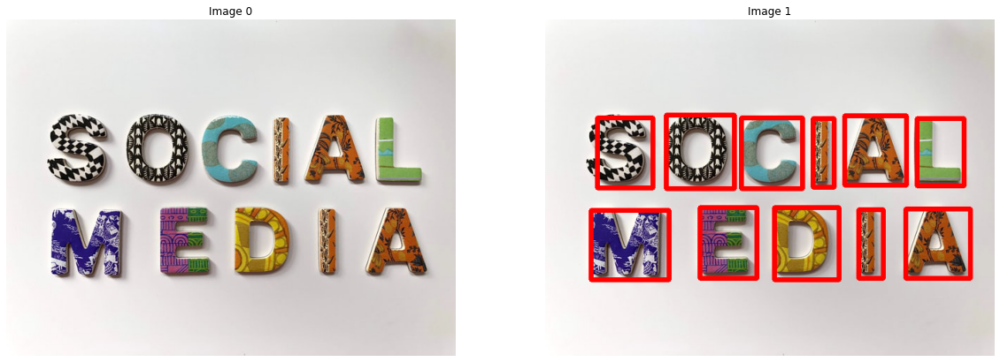

In [17]:
FindDF = LabelDF[LabelDF['area'] > 1700]
result_erosion = image_color.copy()
for idx in FindDF.index:
    result_erosion = mask_area_obj(result_erosion, LabelDF, idx = idx, color = (255,0,0))
ShowImage([image_color, result_erosion], 1, 2)

## Phương pháp morphological closing

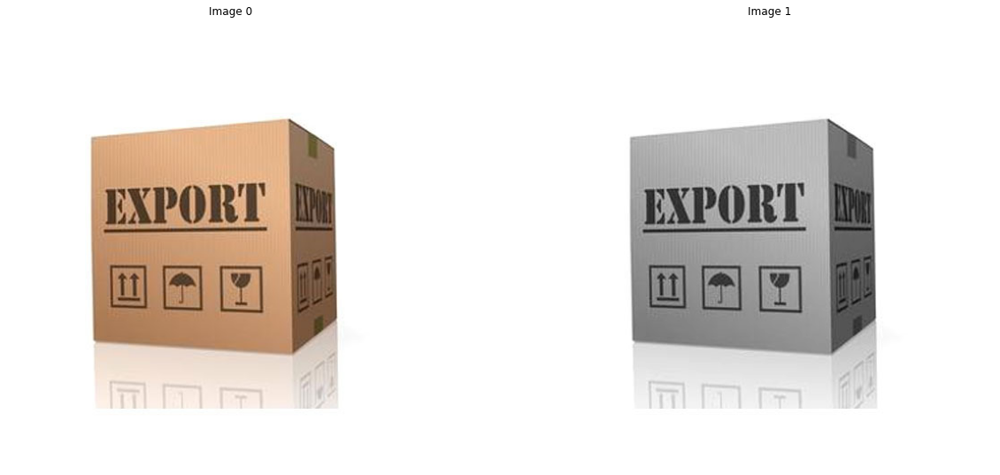

In [18]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/Carton Box.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [19]:
def morphological_closing(image_gray, kernel_size = None, iterations = 1, threshold = 50, fill=True):
    thresh, image_mask = cv2.threshold(image_gray,threshold,255,cv2.THRESH_BINARY_INV)
    
    if kernel_size == None:
        kernel = np.ones((3,3),np.uint8)
    else:
        kernel = np.ones(kernel_size,np.uint8)
    image_closing = cv2.morphologyEx(image_mask, cv2.MORPH_CLOSE, kernel, iterations = iterations)
    
    if fill:
        from scipy import ndimage as ndi
        image_fill = ndi.binary_fill_holes(image_closing)
        return image_mask, image_closing, image_fill
    
    return image_mask, image_closing

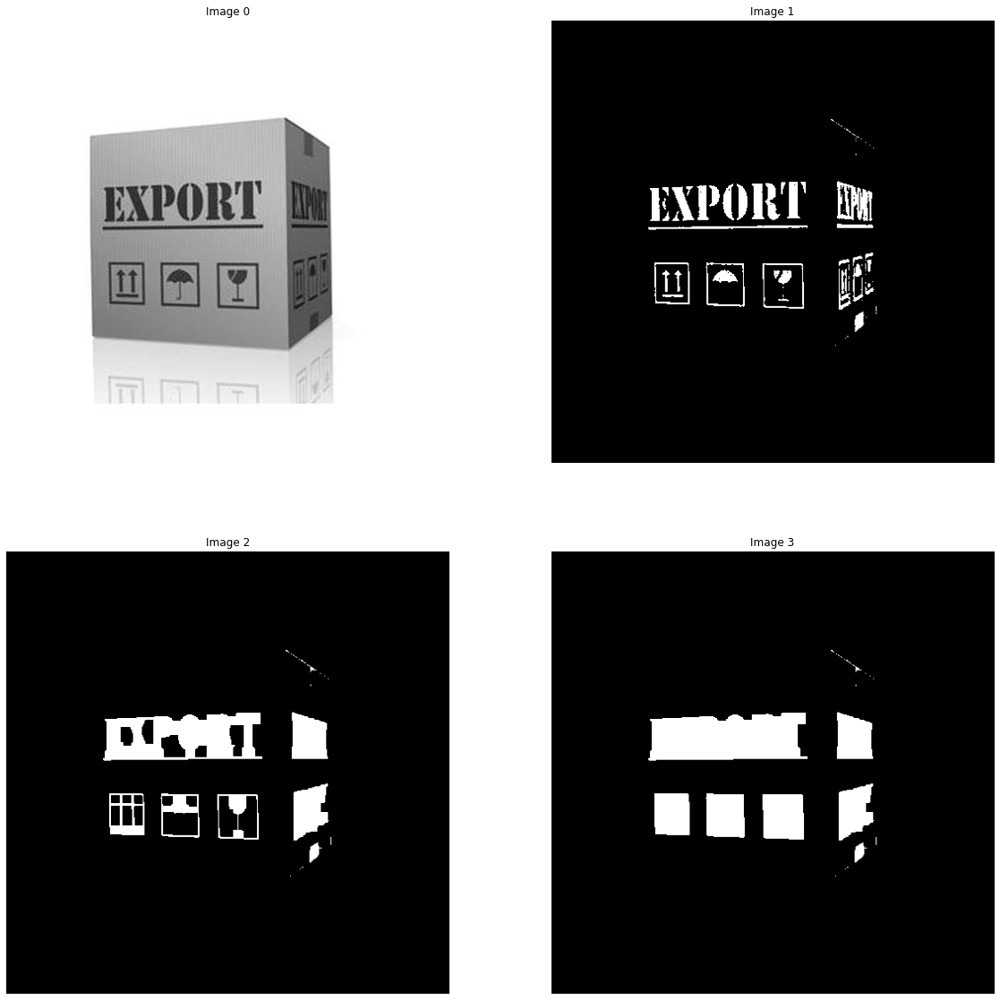

In [20]:
image_mask, image_closing, image_fill = morphological_closing(image_gray,\
                                                kernel_size = (5,5), iterations = 2, threshold = 80)
ShowImage([image_gray, image_mask, image_closing, image_fill], 2, 2)

In [21]:
image_label, LabelDF = get_label_objs(image_fill, image_gray)
LabelDF.head(10)

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,13,210.809,197.717,8168,183,109,237,289,180,54,213,112.943,32
1,17,299.684,261.229,2311,275,238,326,285,47,51,188,130.193,44
2,16,298.491,195.776,2043,274,174,324,218,44,50,175,121.731,42
3,15,296.858,135.567,1847,274,116,321,156,40,47,174,114.315,35
4,12,211.149,340.704,1817,182,322,235,363,41,53,133,73.4172,15
5,14,292.933,341.047,1802,263,324,327,364,40,64,123,81.4401,23
6,19,339.711,346.928,180,329,342,352,356,14,23,99,68.35,49
7,7,132.478,344.043,23,128,339,137,350,11,9,128,90.1304,70
8,18,327,366,9,323,366,332,367,1,9,81,77.1111,74
9,6,124.429,334.286,7,123,332,127,338,6,4,76,73.4286,64


,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,13,210.809,197.717,8168,183,109,237,289,180,54,213,112.943,32
1,17,299.684,261.229,2311,275,238,326,285,47,51,188,130.193,44
2,16,298.491,195.776,2043,274,174,324,218,44,50,175,121.731,42
3,15,296.858,135.567,1847,274,116,321,156,40,47,174,114.315,35
4,12,211.149,340.704,1817,182,322,235,363,41,53,133,73.4172,15
5,14,292.933,341.047,1802,263,324,327,364,40,64,123,81.4401,23


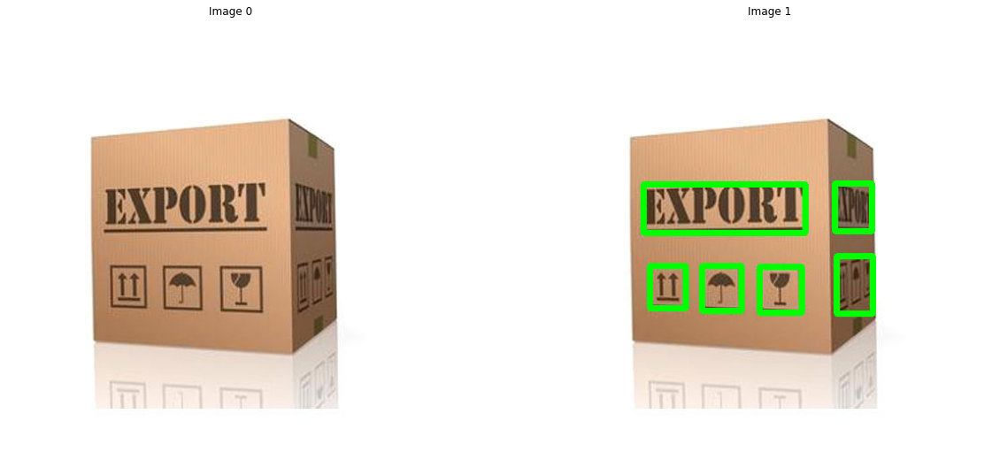

In [22]:
FindDF = LabelDF[LabelDF['area'] > 200]
display(FindDF)
result_closing = image_color.copy()
for idx in FindDF.index:
    result_closing = mask_area_obj(result_closing, FindDF, idx = idx)

ShowImage([image_color, result_closing], 1, 2)

## Phương pháp morphological gradient

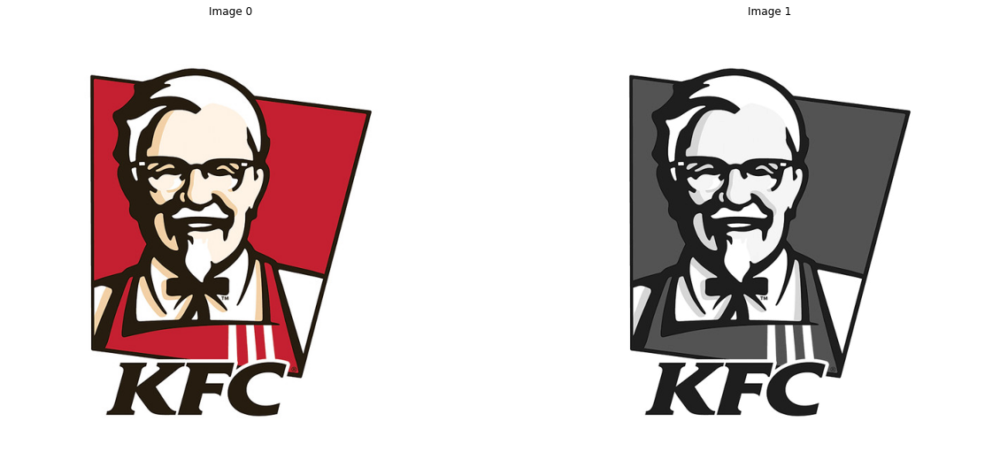

In [23]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/KFC.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [24]:
def morphological_gradient(image_color, kernel_size = None, threshold = 50):
    image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
    thresh, image_mask = cv2.threshold(image_gray,threshold,255,cv2.THRESH_BINARY_INV)
    
    if kernel_size == None:
        kernel = np.ones((3,3),np.uint8)
    else:
        kernel = np.ones(kernel_size,np.uint8)
    image_gradient = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel)

    image_mask_color = cv2.bitwise_and(image_color, image_color, mask = image_mask)
    image_gradient_color = cv2.bitwise_and(image_color, image_color, mask = image_gradient)
    
    return image_mask, image_gradient, image_mask_color, image_gradient_color

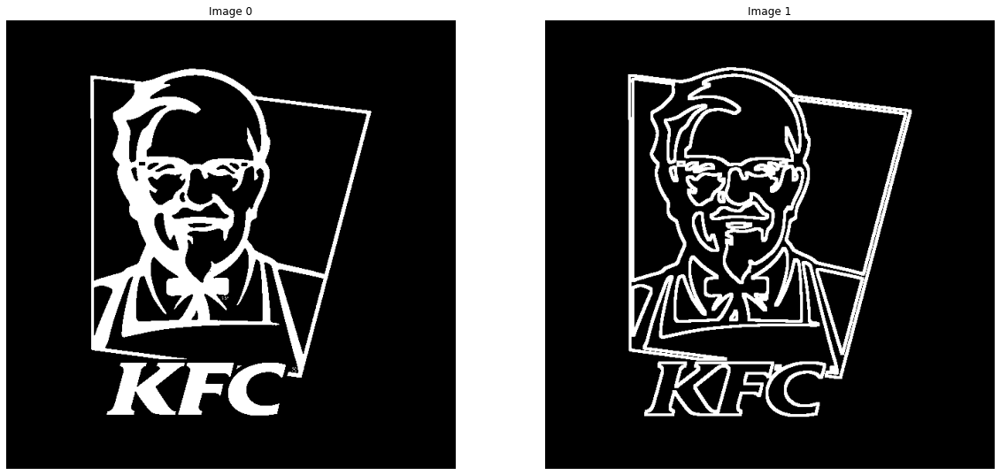

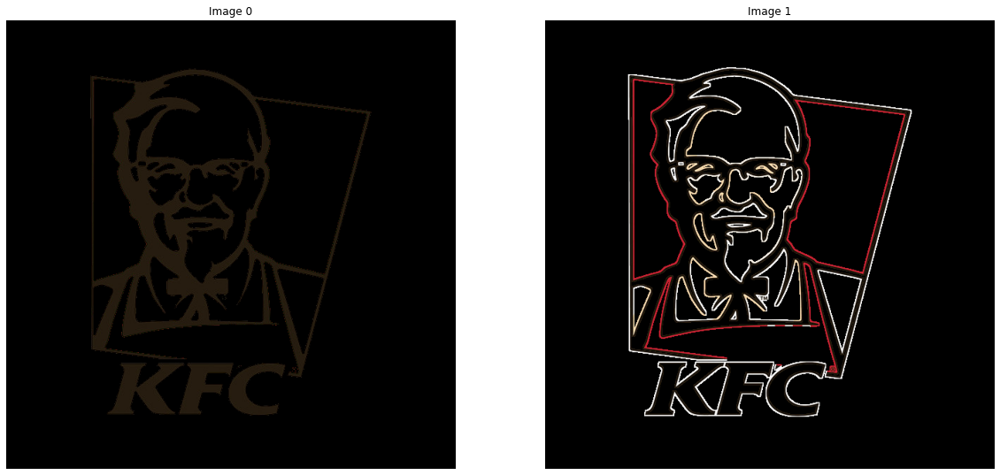

In [25]:
image_mask, image_gradient, image_mask_color, image_gradient_color = morphological_gradient(image_color, kernel_size = (5,5), threshold = 50)

ShowImage([image_mask, image_gradient], 1, 2)
ShowImage([image_mask_color, image_gradient_color], 1, 2)

## Phương pháp morphological opening

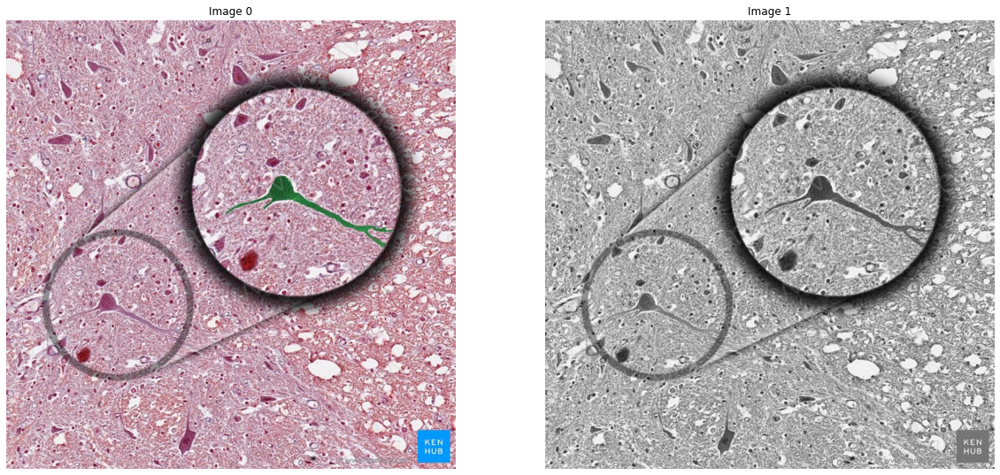

In [26]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/cell.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [27]:
def morphological_opening(image_color, kernel_size = None, iterations = 1, threshold = 50):
    image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
    thresh, image_mask = cv2.threshold(image_gray,threshold,255,cv2.THRESH_BINARY_INV)
    
    if kernel_size == None:
        kernel = np.ones((3,3),np.uint8)
    else:
        kernel = np.ones(kernel_size,np.uint8)
        
    image_erosion = cv2.erode(image_mask,kernel,iterations = iterations)
    image_mask = image_erosion.copy()
    
    image_opening = cv2.morphologyEx(image_mask, cv2.MORPH_OPEN, kernel)
    image_opening_color = cv2.bitwise_and(image_color, image_color, mask = image_opening)
    
    return image_mask, image_opening, image_opening_color

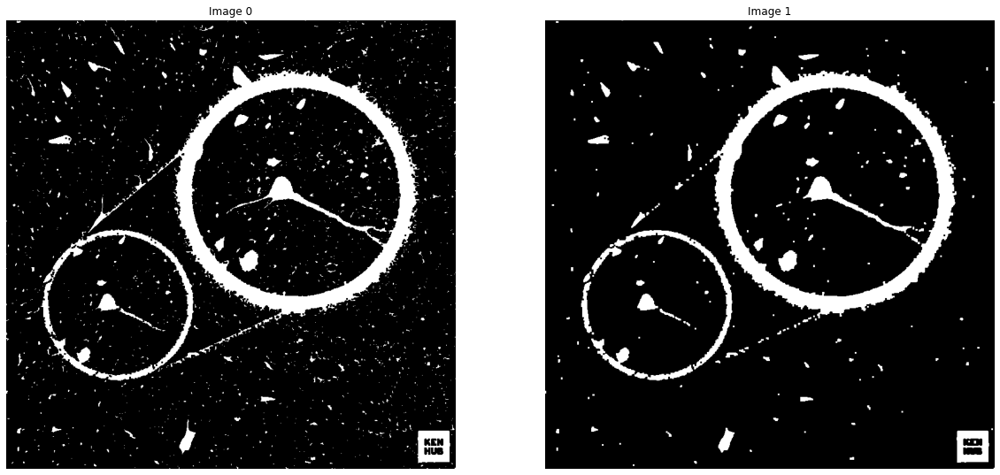

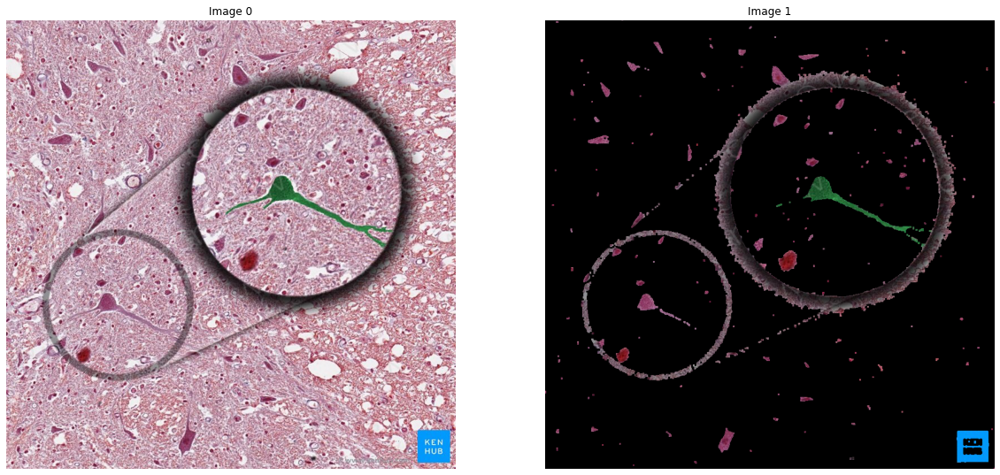

In [28]:
image_mask, image_opening, image_opening_color = morphological_opening(image_color, iterations = 1, threshold = 150)

ShowImage([image_mask, image_opening], 1, 2)
ShowImage([image_color, image_opening_color], 1, 2)

## Kiếm một ảnh biển số xe và thực hiện kết hợp các phương pháp Morphology để trích các con số trên biển số xe

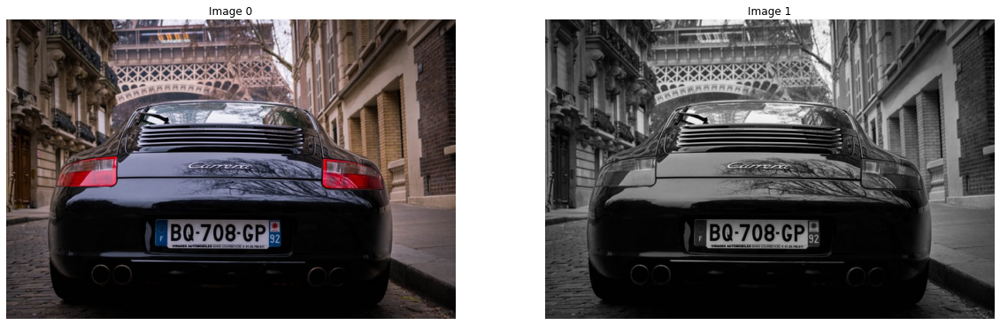

In [29]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/license_plate1.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

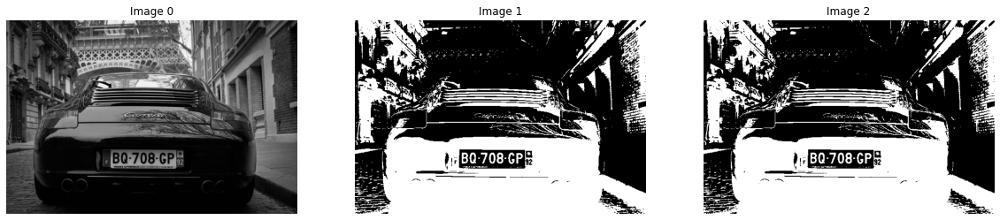

In [30]:
image_mask, image_erosion = morphological_erosion(image_gray, kernel_size = (3,3), iterations = 0, threshold = 50)
ShowImage([image_gray, image_mask, image_erosion], 1, 3)

In [31]:
image_label, LabelDF = get_label_objs(image_erosion, image_gray)
LabelDF.tail(11)

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
730,393,197,481,1,197,481,198,482,1,1,50,50,50
731,392,196,609,1,196,609,197,610,1,1,48,48,48
732,391,196,479,1,196,479,197,480,1,1,47,47,47
733,390,196,83,1,196,83,197,84,1,1,48,48,48
734,388,195,477,1,195,477,196,478,1,1,50,50,50
735,385,193,483,1,193,483,194,484,1,1,49,49,49
736,383,192,155,1,192,155,193,156,1,1,49,49,49
737,382,192,124,1,192,124,193,125,1,1,47,47,47
738,381,191,126,1,191,126,192,127,1,1,48,48,48
739,376,189,467,1,189,467,190,468,1,1,50,50,50


,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
19,609,303.185,240.828,227,292,235,316,249,14,24,47,9.44934,0
20,613,303.487,318.743,226,292,312,316,326,14,24,50,9.84513,0
21,610,303.779,259,208,292,252,316,266,14,24,50,10.4231,0
22,612,303.337,301.637,193,292,295,316,309,14,24,49,9.33679,0
25,614,304.227,343.33,176,292,337,317,351,14,25,50,9.09659,0
26,615,301.595,359.873,173,293,355,316,369,14,23,47,11.2081,0
33,611,300.373,284.41,134,292,277,316,291,14,24,50,8.76866,0


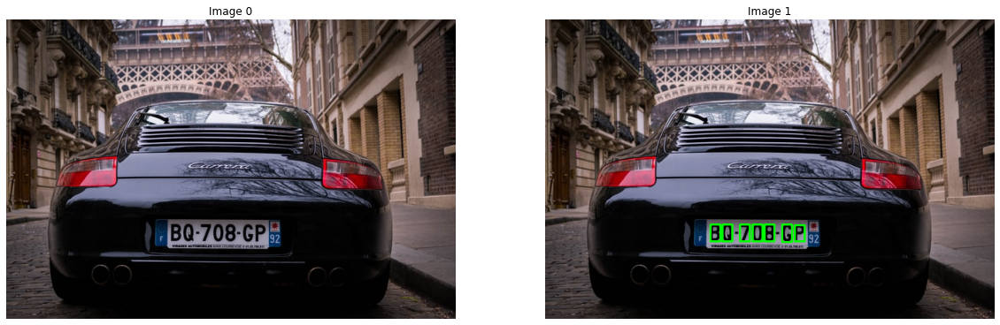

In [32]:
FindDF = LabelDF.loc[(LabelDF['area']>130) & (LabelDF['area']<230)\
                     & (LabelDF['mean_intensity']>8) & (LabelDF['mean_intensity']<12)]
display(FindDF)
result_erosion = image_color.copy()
for idx in FindDF.index:
    result_erosion = mask_area_obj(result_erosion, LabelDF, idx = idx, color = (0,255,0), width_line=2)
ShowImage([image_color, result_erosion], 1, 2)

## Kiếm một ảnh chụp biển hiệu shop bán hàng kết hợp các phương pháp Morphology để trích các thông tin cửa hiệu 

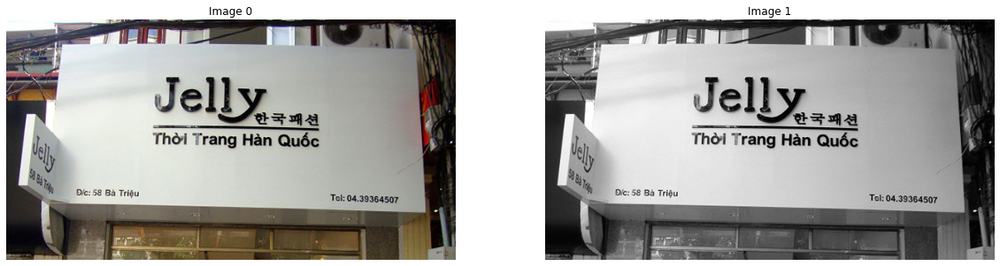

In [33]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/bang-hieu-cong-ty.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

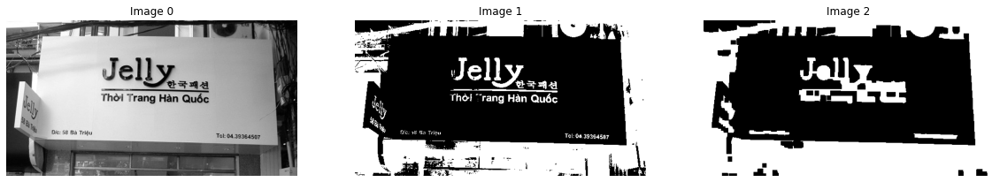

In [34]:
image_mask, image_closing = morphological_closing(image_gray, kernel_size = (5,5), iterations = 2, threshold = 110, fill=False)
ShowImage([image_gray, image_mask, image_closing], 1, 3)

In [35]:
image_label, LabelDF = get_label_objs(image_closing, image_gray)
LabelDF.head(10)

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,1,193.843,310.909,72549,0,0,321,600,600,321,254,64.996,0
1,2,132.983,306.228,8697,77,196,172,418,222,95,248,87.8416,0
2,6,239.022,478.335,744,233,433,245,524,91,12,214,112.239,0
3,3,181.556,50.3451,594,155,36,205,65,29,50,189,115.778,27
4,5,231.453,135.046,519,227,94,238,177,83,11,254,155.956,2
5,4,216.027,46.9338,408,199,31,232,63,32,33,175,110.62,31


,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
1,2,132.983,306.228,8697,77,196,172,418,222,95,248,87.8416,0
2,6,239.022,478.335,744,233,433,245,524,91,12,214,112.239,0
3,3,181.556,50.3451,594,155,36,205,65,29,50,189,115.778,27
4,5,231.453,135.046,519,227,94,238,177,83,11,254,155.956,2
5,4,216.027,46.9338,408,199,31,232,63,32,33,175,110.62,31


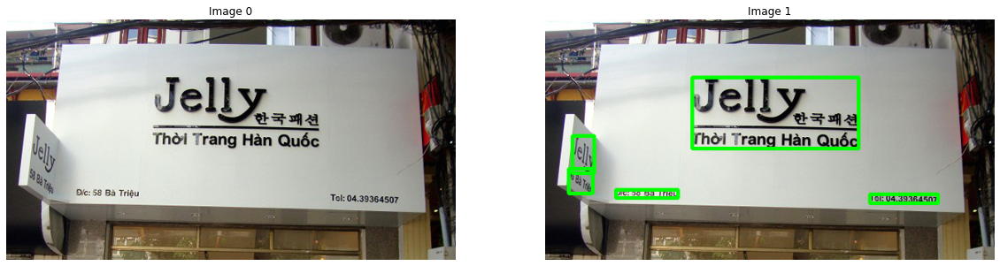

In [36]:
FindDF = LabelDF.loc[(LabelDF['area'] < 10000)]
display(FindDF)
result_closing = image_color.copy()
for idx in FindDF.index:
    result_closing = mask_area_obj(result_closing, FindDF, idx = idx, width_line=3)

ShowImage([image_color, result_closing], 1, 2)

#Chụp 1 dòng chat của bạn và sau đó dùng Morphology để trích các dòng chat đó ra 

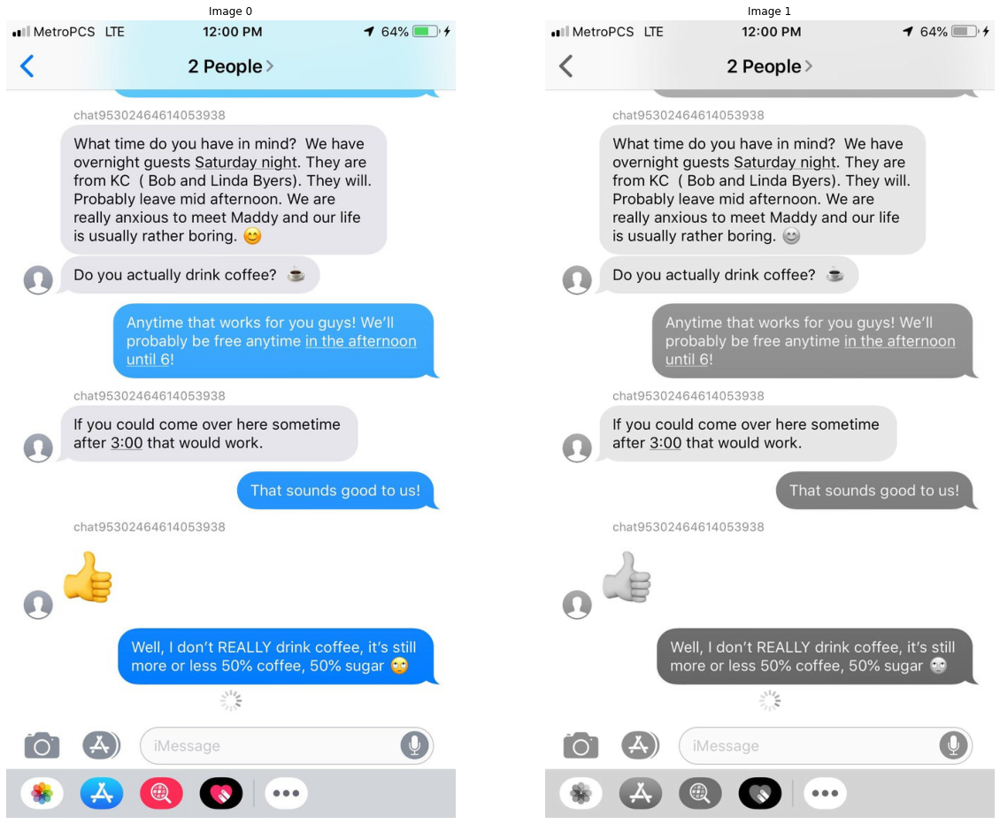

In [37]:
# Read Image
image_color, image_gray = read_image("Lab07 - Image/text_message.jpg")
# Display Image
ShowImage([image_color, image_gray], 1, 2)

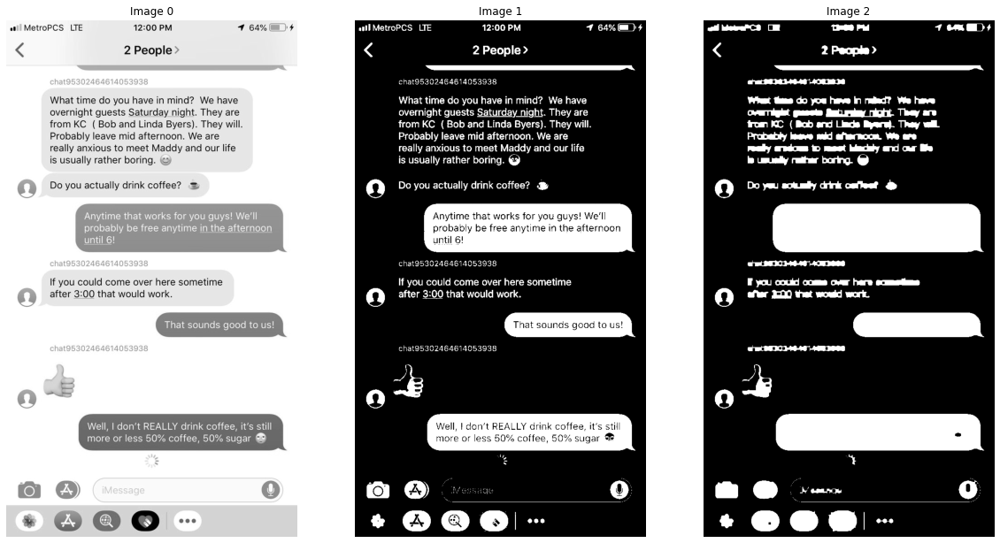

In [38]:
image_mask_1, image_closing_1 = morphological_closing(image_gray, kernel_size = (3,3), iterations = 2, threshold = 200, fill=False)
ShowImage([image_gray, image_mask_1, image_closing_1], 1, 3)

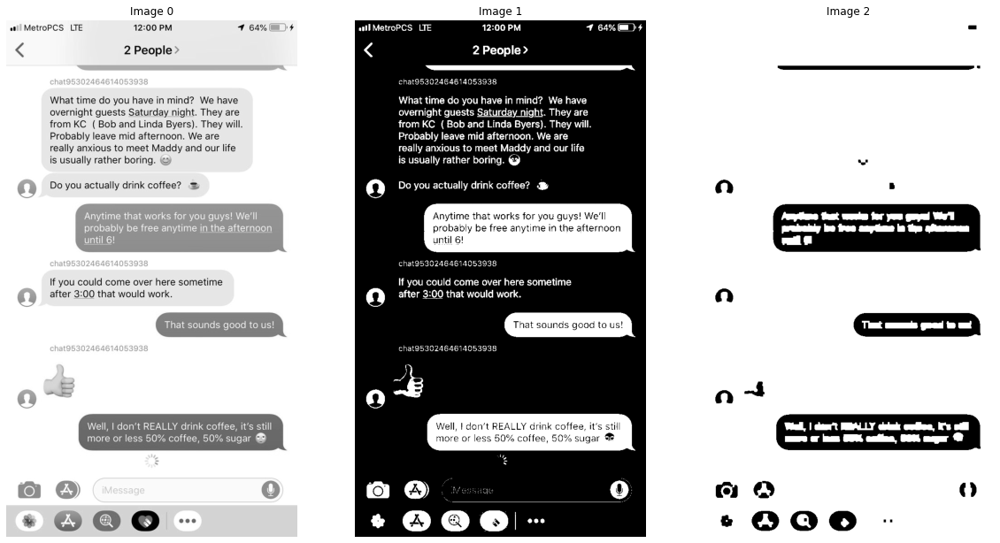

In [39]:
image_mask, image_erosion = morphological_erosion(image_gray, kernel_size = (3,3), iterations = 1, threshold = 200)
image_erosion = cv2.bitwise_not(image_erosion)
kernel = np.ones((3,3),np.uint8)
iterations = 2
image_closing = cv2.morphologyEx(image_erosion, cv2.MORPH_CLOSE, kernel, iterations = iterations)
ShowImage([image_gray, image_mask, image_closing], 1, 3)

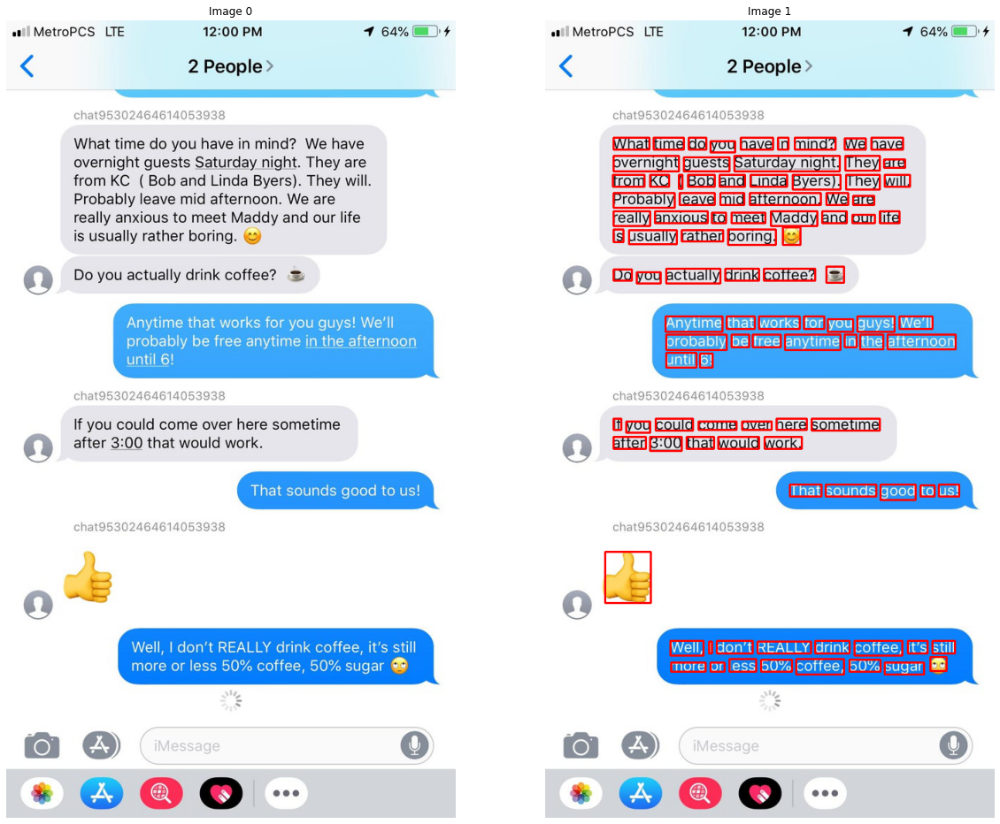

In [40]:
result_erosion = image_color.copy()

image_label_1, LabelDF_1 = get_label_objs(image_closing_1, image_gray)
FindDF_1 = LabelDF_1.loc[(LabelDF_1['area'] > 50) & (LabelDF_1['area'] < 10000) \
                         & ((LabelDF_1['minr'] > 150) & (LabelDF_1['minr'] < 400)\
                         | (LabelDF_1['minr'] > 550) & (LabelDF_1['minr'] < 600)\
                         | (LabelDF_1['minr'] > 750) & (LabelDF_1['minr'] < 800))\
                         & (LabelDF_1['minc'] > 80)]

for idx in FindDF_1.index:
    result_erosion = mask_area_obj(result_erosion, LabelDF_1, idx = idx, color = (255,0,0), width_line=2)


image_label, LabelDF = get_label_objs(image_closing, image_gray)
FindDF = LabelDF.loc[(LabelDF['area'] > 50) & (LabelDF['area'] < 1500) \
                     & (LabelDF['minr'] > 400) & (LabelDF['minr'] <1000)]

for idx in FindDF.index:
    result_erosion = mask_area_obj(result_erosion, LabelDF, idx = idx, color = (255,0,0), width_line=2)

ShowImage([image_color, result_erosion], 1, 2)